# SqueezeNet Cotton Weed Classification (Base + Vision-Mamba)

Is notebook me InceptionV3 / EfficientNetB0 wale dono notebooks jaisa hi format follow kiya gaya hai:
- 70/10/20 stratified train/val/test split
- Phase 1 (10 epochs, frozen backbone) + Phase 2 (25 epochs, fine-tuning, cosine LR)
- Same augmentation, callbacks, evaluation metrics, Grad-CAM, LIME, SHAP, McNemar test, Wilcoxon test
- Sirf backbone SqueezeNet hai (InceptionV3/EfficientNetB0 ki jagah)

**Bas ek kaam karna hai:** neeche `DRIVE_ZIP_PATH` me apne zip dataset ka Google Drive path paste kar dein.
Zip **automatically extract** ho jayegi, manually unzip karne ki zaroorat nahi hai.

In [ ]:
# ============================================================
# 1. IMPORTS AND CONFIGURATION
# ============================================================

import os
import shutil
import pathlib
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from google.colab import drive

from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_recall_fscore_support,
    accuracy_score,
    roc_curve,
    auc
)

from sklearn.preprocessing import label_binarize

from scipy.stats import wilcoxon
from statsmodels.stats.contingency_tables import mcnemar

import seaborn as sns


# ============================================================
# 2. GOOGLE DRIVE
# ============================================================

drive.mount('/content/drive')


# ============================================================
# 3. GPU AND MIXED PRECISION
# ============================================================

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU detected:", gpus)
    tf.keras.mixed_precision.set_global_policy('mixed_float16')
    print("Mixed precision enabled")
else:
    print("WARNING: GPU not detected. Training will be slow.")


# ============================================================
# 4. CONFIGURATION
# ============================================================

IMG_SIZE = 224          # SqueezeNet standard input size
BATCH_SIZE = 32
SEED = 42

BASE_PHASE1_EPOCHS = 10
BASE_PHASE2_EPOCHS = 25

MAMBA_PHASE1_EPOCHS = 10
MAMBA_PHASE2_EPOCHS = 25

TRAIN_RATIO = 0.70
VAL_RATIO = 0.10
TEST_RATIO = 0.20

# ---- PASTE YOUR ZIP DATASET PATH FROM DRIVE HERE ----
# Example: '/content/drive/MyDrive/cotton_weed_merged.zip'
DRIVE_ZIP_PATH = '/content/drive/MyDrive/cotton_dataset-20260808T073110Z-1-001.zip'

# Where the zip gets extracted to on the local Colab disk
LOCAL_DATA_PATH = '/content/cotton_weed_local'

BASE_SAVE_PATH = '/content/drive/MyDrive/SqueezeNet_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba.keras'

os.makedirs(os.path.dirname(MAMBA_SAVE_PATH), exist_ok=True)


# ============================================================
# 5. AUTO-EXTRACT ZIP DATASET FROM DRIVE (NO MANUAL UNZIP NEEDED)
# ============================================================
# Just paste the .zip path from your Drive in DRIVE_ZIP_PATH above.
# This cell extracts it once to local Colab storage (much faster I/O
# than reading directly from Drive) and auto-detects the actual class
# folder root even if the zip has one extra wrapper folder inside it
# (e.g. "cotton_weed_merged/cotton_weed_merged/class_a/...").

def find_class_root(extracted_path):
    """
    Walks the extracted folder and returns the directory whose
    immediate children are the class folders (i.e. the first level
    that actually contains images inside subfolders).
    """
    extracted_path = pathlib.Path(extracted_path)

    def has_class_subdirs(p):
        subdirs = [d for d in p.iterdir() if d.is_dir()]
        if not subdirs:
            return False
        # at least one subdir must directly contain image files
        for d in subdirs:
            for f in d.iterdir():
                if f.suffix.lower() in {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}:
                    return True
        return False

    if has_class_subdirs(extracted_path):
        return extracted_path

    # Only one wrapper folder inside -> go one level deeper
    children = [d for d in extracted_path.iterdir() if d.is_dir()]
    if len(children) == 1 and has_class_subdirs(children[0]):
        return children[0]

    # Fall back: search recursively for the first dir that qualifies
    for d in extracted_path.rglob('*'):
        if d.is_dir() and has_class_subdirs(d):
            return d

    return extracted_path


if not os.path.exists(LOCAL_DATA_PATH):
    if not os.path.exists(DRIVE_ZIP_PATH):
        raise FileNotFoundError(
            f"Zip dataset not found at: {DRIVE_ZIP_PATH}\n"
            f"Update DRIVE_ZIP_PATH with the correct path of your zip file on Drive."
        )

    print("Extracting cotton dataset zip to local Colab storage...")
    os.makedirs(LOCAL_DATA_PATH, exist_ok=True)
    with zipfile.ZipFile(DRIVE_ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(LOCAL_DATA_PATH)
    print("Dataset extracted successfully.")
else:
    print("Local cotton dataset already exists (skipping extraction).")

base_data_path = str(find_class_root(LOCAL_DATA_PATH))
print("Using dataset root:", base_data_path)


# ============================================================
# 6-7. STRATIFIED TRAIN/VAL/TEST SPLIT (FILE-LEVEL, NOT BATCH-LEVEL)
# ============================================================
# Splitting at file level, per class, so every class is exactly split
# 70/10/20. This keeps every class represented proportionally in
# train/val/test and avoids the unstable accuracy that comes from
# shuffling/splitting an already-batched dataset.

IMG_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp', '.tmp'}

data_dir = pathlib.Path(base_data_path)
class_names = sorted([d.name for d in data_dir.iterdir() if d.is_dir()])
num_classes = len(class_names)

print("\nClasses:", class_names)
print("Number of classes:", num_classes)

train_files, val_files, test_files = [], [], []
train_labels, val_labels, test_labels = [], [], []

rng = np.random.default_rng(SEED)

for idx, cls in enumerate(class_names):
    cls_dir = data_dir / cls
    files = sorted([
        str(p) for p in cls_dir.iterdir()
        if p.suffix.lower() in IMG_EXTENSIONS
    ])
    files = np.array(files)
    rng.shuffle(files)

    n = len(files)
    n_train = int(n * TRAIN_RATIO)
    n_val = int(n * VAL_RATIO)
    n_test = n - n_train - n_val  # remainder -> no images dropped

    train_files.extend(files[:n_train]);                train_labels.extend([idx] * n_train)
    val_files.extend(files[n_train:n_train + n_val]);     val_labels.extend([idx] * n_val)
    test_files.extend(files[n_train + n_val:]);           test_labels.extend([idx] * n_test)

train_files = np.array(train_files); train_labels = np.array(train_labels)
val_files = np.array(val_files);     val_labels = np.array(val_labels)
test_files = np.array(test_files);   test_labels = np.array(test_labels)

print("\nDataset split (file-level, stratified per class):")
print("Train images:", len(train_files))
print("Validation images:", len(val_files))
print("Test images:", len(test_files))

steps_per_epoch_train = max(1, len(train_files) // BATCH_SIZE)


def load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    # Preprocessing shifted to pipeline level to allow correct augmentation
    img.set_shape((IMG_SIZE, IMG_SIZE, 3))
    return img, label

def make_dataset(files, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(files), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    return ds

train_ds = make_dataset(train_files, train_labels, training=True)
val_ds = make_dataset(val_files, val_labels)
test_ds = make_dataset(test_files, test_labels)


# ========= STRATIFIED SPLIT TABLE ===========

def count_images_per_class(data_path):
    class_counts = {}
    for class_name in sorted(os.listdir(data_path)):
        class_dir = os.path.join(data_path, class_name)
        if not os.path.isdir(class_dir):
            continue
        count = sum(
            1 for f in os.listdir(class_dir)
            if os.path.splitext(f)[1].lower() in IMG_EXTENSIONS
        )
        class_counts[class_name] = count
    return class_counts


def compute_split_counts(class_counts, train_ratio, val_ratio, test_ratio):
    split_rows = []
    for class_name, total in class_counts.items():
        train_n = int(total * train_ratio)
        val_n = int(total * val_ratio)
        test_n = total - train_n - val_n
        split_rows.append((class_name, train_n, val_n, test_n, total))
    return split_rows


def print_stratified_report(split_rows):
    total_train = sum(r[1] for r in split_rows)
    total_val = sum(r[2] for r in split_rows)
    total_test = sum(r[3] for r in split_rows)
    total_all = sum(r[4] for r in split_rows)
    n_cls = len(split_rows)

    avg_train = total_train / n_cls if n_cls else 0
    avg_val = total_val / n_cls if n_cls else 0
    avg_test = total_test / n_cls if n_cls else 0

    print("PERFECTLY STRATIFIED DISTRIBUTION")
    print("=" * 60)
    print(f"Training Images   : {total_train:<6} ({avg_train:.1f} per class)")
    print(f"Validation Images : {total_val:<6} ({avg_val:.1f} per class)")
    print(f"Testing Images    : {total_test:<6} ({avg_test:.1f} per class)")
    print(f"Total Images      : {total_all} / {total_all}")
    print()
    print("=" * 78)
    print("CLASS-WISE IMAGE DISTRIBUTION")
    print("=" * 78)

    name_width = max(len(r[0]) for r in split_rows) + 2
    name_width = max(name_width, len("Class") + 2)

    header = (
        f"{'Class':<{name_width}}{'Train':>8}{'Validation':>13}"
        f"{'Test':>8}{'Total':>8}"
    )
    print(header)
    print("-" * len(header))

    for class_name, train_n, val_n, test_n, total in split_rows:
        print(
            f"{class_name:<{name_width}}{train_n:>8}{val_n:>13}"
            f"{test_n:>8}{total:>8}"
        )

    print("-" * len(header))
    print(
        f"{'TOTAL':<{name_width}}{total_train:>8}{total_val:>13}"
        f"{total_test:>8}{total_all:>8}"
    )
    print("=" * 78)


class_counts = count_images_per_class(base_data_path)
split_rows = compute_split_counts(class_counts, TRAIN_RATIO, VAL_RATIO, TEST_RATIO)
print_stratified_report(split_rows)


# ============================================================
# 8. SQUEEZENET-STYLE PREPROCESSING
# ============================================================
# SqueezeNet's original (Caffe) ImageNet training used BGR ordering and
# mean subtraction. We follow the same convention here so that the
# optional pretrained weights (loaded in the next cell) line up with
# what the network expects. If pretrained weights fail to download,
# this preprocessing still works fine for training from scratch.

_SQUEEZENET_MEAN = tf.constant([103.939, 116.779, 123.68])  # BGR means

def squeezenet_preprocess_input(x):
    x = tf.cast(x, tf.float32)
    x = x[..., ::-1]  # RGB -> BGR
    x = x - _SQUEEZENET_MEAN
    return x


# ============================================================
# 9. DATA AUGMENTATION (STRENGTHENED)
# ============================================================

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.10),
    layers.RandomBrightness(0.10),
], name="data_augmentation")

# Augment first on [0, 255] -> Then apply SqueezeNet preprocess_input
train_ds = train_ds.map(
    lambda x, y: (squeezenet_preprocess_input(data_augmentation(x, training=True)), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

val_ds = val_ds.map(
    lambda x, y: (squeezenet_preprocess_input(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

test_ds = test_ds.map(
    lambda x, y: (squeezenet_preprocess_input(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
)

train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

print("Dataset pipeline ready.")


# ============================================================
# 10. COMMON CALLBACKS
# ============================================================

def get_callbacks(save_path, patience=8):
    return [
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-8,
            verbose=1
        ),

        EarlyStopping(
            monitor='val_loss',
            patience=patience,
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


def get_callbacks_cosine(save_path, patience=8):
    # ReduceLROnPlateau can't be used with a LearningRateSchedule
    # (CosineDecay, used in phase 2) because Keras raises TypeError when
    # trying to manually overwrite a schedule-driven learning rate.
    # CosineDecay already handles LR decay on its own.
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=patience,
            restore_best_weights=True,
            verbose=1
        ),

        ModelCheckpoint(
            save_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]


Mounted at /content/drive
GPU detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mixed precision enabled
Extracting cotton dataset zip to local Colab storage...
Dataset extracted successfully.
Using dataset root: /content/cotton_weed_local/cotton_dataset

Classes: ['Amaranthus viridis', 'Carpetweeds', 'Cleome gynandra', 'Commelina benghalensis', 'Cynodon dactylon', 'Echinochloa colona', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'Phyllanthus urinaria', 'Purslane', 'Trianthema portulacastrum', 'cotton']
Number of classes: 13

Dataset split (file-level, stratified per class):
Train images: 4550
Validation images: 650
Test images: 1300
PERFECTLY STRATIFIED DISTRIBUTION
Training Images   : 4550   (350.0 per class)
Validation Images : 650    (50.0 per class)
Testing Images    : 1300   (100.0 per class)
Total Images      : 6500 / 6500

CLASS-WISE IMAGE DISTRIBUTION
Class                         Train   Validation    Test   Total
----------------------------------

## SqueezeNet Baseline Model — Build, Train (Phase 1 + Phase 2), Evaluate

In [ ]:
# ============================================================
# 11. SQUEEZENET 1.1 BACKBONE (FIRE MODULES + ROBUST PRETRAINED LOADER)
# ============================================================
# IMPORTANT:
# The public Keras SqueezeNet H5 file uses names such as
# "fire2/squeeze1x1", while Keras 3 does not allow "/" in layer names.
# The previous by_name=True loader therefore loaded only conv1 (~4%).
#
# This version keeps the existing architecture/names used by the rest
# of the notebook, but manually maps the H5 weights to Conv2D layers
# using a normalized name ("/" -> "_") and verifies BOTH kernels/biases.
# If the public weights cannot be downloaded or do not match, the code
# safely falls back to scratch training exactly as before.
#
# Downstream interface is unchanged:
#     build_squeezenet_backbone(...) -> (backbone, weights_loaded_bool)
# so the BASE and SqueezeNet+Mamba cells below do not need to change.

SQUEEZENET_WEIGHTS_URL = (
    "https://github.com/rcmalli/keras-squeezenet/releases/download/"
    "v1.0/squeezenet_weights_tf_dim_ordering_tf_kernels_notop.h5"
)


def fire_module(x, squeeze_filters, expand_filters, name):
    x = layers.Conv2D(
        squeeze_filters, (1, 1), padding='same',
        activation='relu', name=f"{name}_squeeze1x1"
    )(x)

    left = layers.Conv2D(
        expand_filters, (1, 1), padding='same',
        activation='relu', name=f"{name}_expand1x1"
    )(x)

    right = layers.Conv2D(
        expand_filters, (3, 3), padding='same',
        activation='relu', name=f"{name}_expand3x3"
    )(x)

    return layers.Concatenate(
        axis=-1, name=f"{name}_concat"
    )([left, right])


def _normalize_squeezenet_name(name):
    """Make slash-style and underscore-style layer names comparable."""
    name = str(name)
    name = name.replace("\\", "/")
    name = name.replace("/", "_")
    return name


def _collect_h5_weight_groups(h5_file):
    """
    Collect legacy-Keras H5 layer groups recursively.

    The public SqueezeNet H5 file may store names with '/' as nested
    HDF5 groups. We therefore do not assume a single fixed H5 layout.
    """
    import h5py

    groups = {}

    def visitor(name, obj):
        if not isinstance(obj, h5py.Group):
            return

        # Legacy Keras groups normally contain weight_names.
        if "weight_names" in obj.attrs:
            short_name = name.split("/")[-1]
            normalized_full = _normalize_squeezenet_name(name)
            normalized_short = _normalize_squeezenet_name(short_name)

            # Prefer the full path, but also retain the short normalized name.
            groups.setdefault(normalized_full, obj)
            groups.setdefault(normalized_short, obj)

    h5_file.visititems(visitor)
    return groups


def _read_group_weights(group):
    """
    Read all datasets listed by a legacy-Keras H5 group's weight_names.
    Works with both bytes and strings and with nested H5 dataset paths.
    """
    import numpy as np

    weight_names = group.attrs.get("weight_names", [])

    arrays = []
    for raw_name in weight_names:
        if isinstance(raw_name, bytes):
            raw_name = raw_name.decode("utf-8")

        # Dataset may be stored relative to this group or at the root.
        candidates = [
            raw_name,
            raw_name.lstrip("/"),
            raw_name.split("/")[-1],
        ]

        arr = None
        for candidate in candidates:
            try:
                if candidate in group:
                    arr = np.array(group[candidate])
                    break
            except Exception:
                pass

            try:
                arr = np.array(group.file[candidate])
                break
            except Exception:
                pass

        if arr is not None:
            arrays.append(arr)

    return arrays


def _load_squeezenet_h5_weights(backbone, weights_path):
    """
    Manually load matching Conv2D weights from the public H5 file.

    Returns:
        loaded_layers: list of Conv2D layer names whose weights were
                       successfully assigned.
    """
    import h5py
    import numpy as np

    loaded_layers = []

    with h5py.File(weights_path, "r") as f:
        groups = _collect_h5_weight_groups(f)

        conv_layers = [
            layer for layer in backbone.layers
            if isinstance(layer, layers.Conv2D)
        ]

        for layer in conv_layers:
            target = _normalize_squeezenet_name(layer.name)

            # Exact normalized match first.
            group = groups.get(target)

            # Fallback: compare terminal normalized names.
            if group is None:
                for key, candidate in groups.items():
                    if key == target or key.endswith("_" + target):
                        group = candidate
                        break

            if group is None:
                continue

            arrays = _read_group_weights(group)

            current = layer.get_weights()
            if not arrays or len(arrays) != len(current):
                continue

            if any(a.shape != w.shape for a, w in zip(arrays, current)):
                continue

            # Copy arrays before assignment so the model owns its weights.
            layer.set_weights([np.array(a, copy=True) for a in arrays])
            loaded_layers.append(layer.name)

    return loaded_layers


def build_squeezenet_backbone(
    input_tensor,
    load_imagenet=True,
    name='squeezenet_backbone'
):
    """
    Returns (backbone_model, weights_loaded_bool).

    weights_loaded is True only when >=80% of Conv2D layers were
    successfully matched AND their weights actually changed.
    This prevents accidentally freezing a randomly initialized backbone.
    """
    x = layers.Conv2D(
        64, (3, 3), strides=(2, 2), padding='valid',
        activation='relu', name='conv1'
    )(input_tensor)

    x = layers.MaxPooling2D(
        pool_size=(3, 3), strides=(2, 2), name='pool1'
    )(x)

    x = fire_module(x, 16, 64, name='fire2')
    x = fire_module(x, 16, 64, name='fire3')

    x = layers.MaxPooling2D(
        pool_size=(3, 3), strides=(2, 2), name='pool3'
    )(x)

    x = fire_module(x, 32, 128, name='fire4')
    x = fire_module(x, 32, 128, name='fire5')

    x = layers.MaxPooling2D(
        pool_size=(3, 3), strides=(2, 2), name='pool5'
    )(x)

    x = fire_module(x, 48, 192, name='fire6')
    x = fire_module(x, 48, 192, name='fire7')
    x = fire_module(x, 64, 256, name='fire8')
    x = fire_module(x, 64, 256, name='fire9')

    backbone = models.Model(
        input_tensor, x, name=name
    )

    weights_loaded = False

    if load_imagenet:
        try:
            import numpy as np

            weights_path = tf.keras.utils.get_file(
                'squeezenet_weights_tf_dim_ordering_tf_kernels_notop.h5',
                SQUEEZENET_WEIGHTS_URL,
                cache_subdir='models'
            )

            # Snapshot every Conv2D kernel before loading.
            conv_layers = [
                layer for layer in backbone.layers
                if isinstance(layer, layers.Conv2D)
            ]
            before = {
                layer.name: [w.copy() for w in layer.get_weights()]
                for layer in conv_layers
            }

            loaded_names = _load_squeezenet_h5_weights(
                backbone, weights_path
            )

            # Verify actual numerical changes, not just name matches.
            verified_names = []

            for layer in conv_layers:
                old_weights = before[layer.name]
                new_weights = layer.get_weights()

                if len(old_weights) != len(new_weights):
                    continue

                changed = any(
                    not np.allclose(old, new, rtol=1e-6, atol=1e-7)
                    for old, new in zip(old_weights, new_weights)
                )

                if changed and layer.name in loaded_names:
                    verified_names.append(layer.name)

            frac_loaded = len(verified_names) / max(1, len(conv_layers))
            weights_loaded = frac_loaded >= 0.80

            print(
                f"SqueezeNet ({name}): "
                f"{len(verified_names)}/{len(conv_layers)} Conv2D layers "
                f"received verified pretrained weights "
                f"({frac_loaded*100:.0f}%)."
            )

            if weights_loaded:
                print(
                    f"SqueezeNet ({name}): ImageNet weights VERIFIED "
                    f"across the backbone."
                )
            else:
                print(
                    f"SqueezeNet ({name}): only "
                    f"{len(verified_names)}/{len(conv_layers)} Conv2D layers "
                    f"matched. Backbone will remain TRAINABLE from scratch "
                    f"to avoid freezing random weights."
                )

        except Exception as e:
            print(
                f"SqueezeNet ({name}): could not load/verify ImageNet "
                f"weights ({type(e).__name__}: {e})."
            )
            print(
                "Continuing safely with random initialization. "
                "The rest of the notebook will still run."
            )

    return backbone, weights_loaded


# ============================================================
# 12. BUILD BASE SQUEEZENET MODEL
# ============================================================

print("\nBuilding SqueezeNet baseline...")

base_input = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

base_backbone, base_weights_loaded = build_squeezenet_backbone(
    base_input,
    load_imagenet=True,
    name='squeezenet_backbone_base'
)

if base_weights_loaded:
    base_backbone.trainable = False
    print(
        "Phase 1: backbone FROZEN "
        "(verified pretrained features available)."
    )
else:
    base_backbone.trainable = True
    print(
        "Phase 1: backbone TRAINABLE from the start "
        "(no verified pretrained weights)."
    )

inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_backbone(inputs, training=False)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)

outputs = layers.Dense(
    num_classes,
    activation='softmax',
    dtype='float32'
)(x)

model_base = models.Model(
    inputs,
    outputs,
    name='SqueezeNet_Base'
)


# ============================================================
# 13. BASE MODEL - PHASE 1
# ============================================================

model_base.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=5e-4
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nBASE MODEL - PHASE 1")

base_history_phase1 = model_base.fit(
    train_ds,
    validation_data=val_ds,
    epochs=BASE_PHASE1_EPOCHS
)

# Keep a phase-1 checkpoint so phase 2 can NEVER silently replace a
# better phase-1 model with a worse model.
BASE_PHASE1_SAVE_PATH = '/content/drive/MyDrive/SqueezeNet_Cotton_Phase1.keras'
base_phase1_best_val_acc = max(base_history_phase1.history.get('val_accuracy', [0.0]))
model_base.save(BASE_PHASE1_SAVE_PATH)
print(f"Phase 1 best validation accuracy: {base_phase1_best_val_acc * 100:.2f}%")


# ============================================================
# 14. BASE MODEL - PHASE 2 FINE-TUNING
# ============================================================

base_backbone.trainable = True

if base_weights_loaded:
    FINE_TUNE_AT = int(len(base_backbone.layers) * 0.4)

    for layer in base_backbone.layers[:FINE_TUNE_AT]:
        layer.trainable = False

    for layer in base_backbone.layers[FINE_TUNE_AT:]:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False

    phase2_base_lr = 2e-5

else:
    # Scratch-trained backbone: continue training the complete network.
    phase2_base_lr = 1e-4

base_lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=phase2_base_lr,
    decay_steps=BASE_PHASE2_EPOCHS * steps_per_epoch_train
)

model_base.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=base_lr_schedule
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nBASE MODEL - PHASE 2 FINE-TUNING")

base_history_phase2 = model_base.fit(
    train_ds,
    validation_data=val_ds,
    epochs=BASE_PHASE2_EPOCHS,
    callbacks=get_callbacks_cosine(
        BASE_SAVE_PATH,
        patience=8
    )
)

# Select the better phase by validation accuracy. This protects the
# baseline from a rare phase-2 degradation and keeps downstream Mamba /
# comparison cells stable.
base_phase2_best_val_acc = max(base_history_phase2.history.get('val_accuracy', [0.0]))

if base_phase2_best_val_acc + 1e-8 >= base_phase1_best_val_acc:
    print(
        f"Phase 2 retained: best val_accuracy = "
        f"{base_phase2_best_val_acc * 100:.2f}%"
    )
else:
    print(
        f"Phase 2 was lower ({base_phase2_best_val_acc * 100:.2f}%) than "
        f"Phase 1 ({base_phase1_best_val_acc * 100:.2f}%). "
        f"Restoring Phase 1 model."
    )
    model_base = tf.keras.models.load_model(BASE_PHASE1_SAVE_PATH)
    model_base.save(BASE_SAVE_PATH)


# ============================================================
# 15. LOAD BEST BASE MODEL
# ============================================================

model_base = tf.keras.models.load_model(
    BASE_SAVE_PATH
)

base_loss, base_acc = model_base.evaluate(
    test_ds,
    verbose=0
)

print(
    f"\nBase SqueezeNet Accuracy: "
    f"{base_acc * 100:.2f}%"
)



Building SqueezeNet baseline...
3032184/3032184 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
SqueezeNet (squeezenet_backbone_base): 25/25 Conv2D layers received verified pretrained weights (100%).
SqueezeNet (squeezenet_backbone_base): ImageNet weights VERIFIED across the backbone.
Phase 1: backbone FROZEN (verified pretrained features available).

BASE MODEL - PHASE 1
Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 122s 772ms/step - accuracy: 0.3749 - loss: 2.0361 - val_accuracy: 0.6508 - val_loss: 1.0578
Epoch 2/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 121s 684ms/step - accuracy: 0.5699 - loss: 1.3153 - val_accuracy: 0.6938 - val_loss: 0.9310
Epoch 3/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 96s 665ms/step - accuracy: 0.6277 - loss: 1.1517 - val_accuracy: 0.7646 - val_loss: 0.7985
Epoch 4/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 143s 672ms/step - accuracy: 0.6547 - loss: 1.0543 - val_accuracy: 0.7800 - val_loss: 0.6989
Epoch 5/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 141s 664ms/step - accuracy: 0.6747 - loss: 1.0114 - val_accuracy: 0.7954

## SqueezeNet + Vision Mamba Model — Build, Train (Phase 1 + Phase 2), Evaluate, Compare


Building SqueezeNet + Vision Mamba...
SqueezeNet (squeezenet_backbone_mamba): 25/25 Conv2D layers received verified pretrained weights (100%).
SqueezeNet (squeezenet_backbone_mamba): ImageNet weights VERIFIED across the backbone.
Phase 1: backbone FROZEN (real pretrained features available).

MAMBA MODEL - PHASE 1
Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 696ms/step - accuracy: 0.2249 - loss: 2.8471
Epoch 1: val_accuracy improved from None to 0.59846, saving model to /content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba.keras
143/143 ━━━━━━━━━━━━━━━━━━━━ 129s 777ms/step - accuracy: 0.3244 - loss: 2.3385 - val_accuracy: 0.5985 - val_loss: 1.2275
Epoch 2/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 654ms/step - accuracy: 0.5332 - loss: 1.5079
Epoch 2: val_accuracy improved from 0.59846 to 0.70308, saving model to /content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba.keras

Epoch 2: finished saving model t

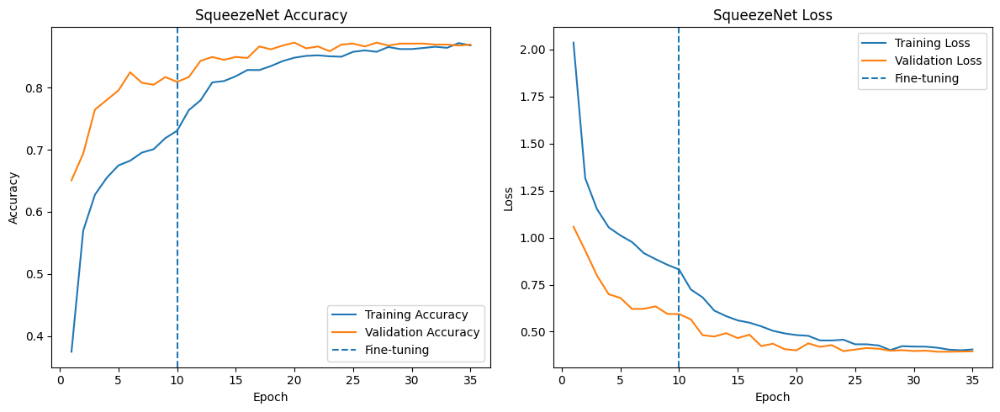

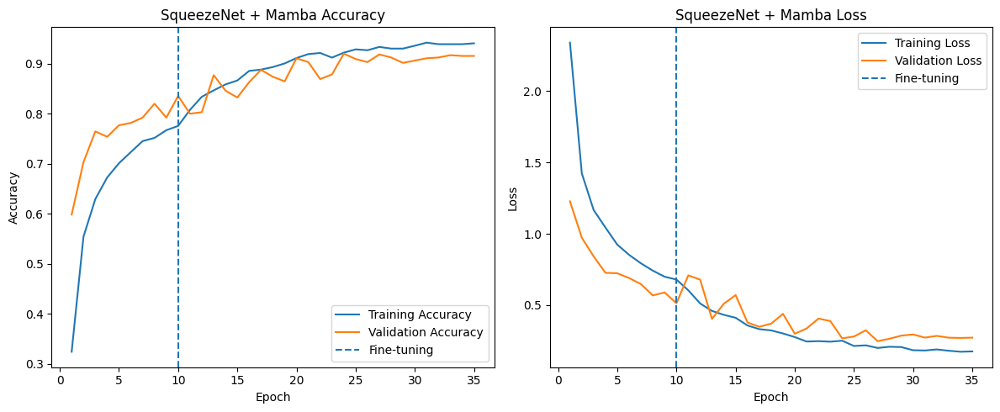

In [ ]:
import keras

# ============================================================
# 16. VISION MAMBA BLOCK (BOTTLENECK OPTIMIZED FOR SQUEEZENET)
# ============================================================

@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


def vision_mamba_block(x, name_prefix="vmamba"):
    H, W, C = x.shape[1], x.shape[2], x.shape[3]
    bottleneck_dim = max(64, C // 4)  # e.g. 512 -> 128 (reduces overfitting)

    # Local spatial branch
    branch1 = layers.DepthwiseConv2D(kernel_size=3, padding='same')(x)
    branch1 = layers.Activation('swish')(branch1)
    branch1 = layers.Reshape((H * W, C))(branch1)

    # Gating branch with Bottleneck
    seq = layers.Reshape((H * W, C))(x)
    branch2 = layers.Dense(bottleneck_dim, activation='swish')(seq)
    branch2 = layers.Dense(C, activation='swish')(branch2)

    # Gated feature interaction
    gated = layers.Multiply()([branch1, branch2])
    gated = layers.Dense(C)(gated)

    out = layers.Reshape((H, W, C))(gated)
    out = LayerScale(C, init_value=1e-2, name=f"{name_prefix}_layerscale_apply")(out)

    return layers.Add()([x, out])


# ============================================================
# 17. BUILD SQUEEZENET + MAMBA MODEL
# ============================================================

print("\nBuilding SqueezeNet + Vision Mamba...")

mamba_input = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
mamba_backbone, mamba_weights_loaded = build_squeezenet_backbone(
    mamba_input, load_imagenet=True, name='squeezenet_backbone_mamba'
)

if mamba_weights_loaded:
    mamba_backbone.trainable = False
    print("Phase 1: backbone FROZEN (real pretrained features available).")
else:
    mamba_backbone.trainable = True
    print("Phase 1: backbone TRAINABLE from the start (no verified pretrained "
          "weights, so freezing random weights would prevent any learning).")

mamba_inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = mamba_backbone(mamba_inputs, training=False)
x = vision_mamba_block(x, name_prefix="vmamba")

x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)

x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.4)(x)

mamba_outputs = layers.Dense(
    num_classes,
    activation='softmax',
    dtype='float32'
)(x)

model_mamba = models.Model(
    mamba_inputs,
    mamba_outputs,
    name='SqueezeNet_Mamba'
)


# ============================================================
# 18. MAMBA MODEL - PHASE 1
# ============================================================

model_mamba.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nMAMBA MODEL - PHASE 1")

mamba_history_phase1 = model_mamba.fit(
    train_ds,
    validation_data=val_ds,
    epochs=MAMBA_PHASE1_EPOCHS,
    callbacks=get_callbacks_cosine(MAMBA_SAVE_PATH, patience=8)
)

MAMBA_PHASE1_SAVE_PATH = '/content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba_Phase1.keras'
mamba_phase1_best_val_acc = max(mamba_history_phase1.history.get('val_accuracy', [0.0]))
model_mamba.save(MAMBA_PHASE1_SAVE_PATH)
print(f"Mamba Phase 1 best validation accuracy: {mamba_phase1_best_val_acc * 100:.2f}%")


# ============================================================
# 19. MAMBA MODEL - PHASE 2 FINE-TUNING
# ============================================================
# SqueezeNet has far fewer layers than InceptionV3, so we unfreeze the
# last 50% of the backbone instead of a fixed layer count (same
# "unfreeze the deeper portion" strategy, scaled to a shallower net).
# Same scratch-vs-pretrained handling as the base model above.

mamba_backbone.trainable = True

if mamba_weights_loaded:
    FINE_TUNE_AT_MAMBA = int(len(mamba_backbone.layers) * 0.5)
    for layer in mamba_backbone.layers[:FINE_TUNE_AT_MAMBA]:
        layer.trainable = False
    for layer in mamba_backbone.layers[FINE_TUNE_AT_MAMBA:]:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False  # Keep BN stats frozen for stability
    phase2_mamba_lr = 1e-4
else:
    # scratch-trained backbone: keep everything trainable
    phase2_mamba_lr = 1e-4

mamba_lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=phase2_mamba_lr,
    decay_steps=MAMBA_PHASE2_EPOCHS * steps_per_epoch_train
)

model_mamba.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=mamba_lr_schedule),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\nMAMBA MODEL - PHASE 2")

mamba_history_phase2 = model_mamba.fit(
    train_ds,
    validation_data=val_ds,
    epochs=MAMBA_PHASE2_EPOCHS,
    callbacks=get_callbacks_cosine(MAMBA_SAVE_PATH, patience=8)
)

mamba_phase2_best_val_acc = max(mamba_history_phase2.history.get('val_accuracy', [0.0]))

if mamba_phase2_best_val_acc + 1e-8 >= mamba_phase1_best_val_acc:
    print(
        f"Mamba Phase 2 retained: best val_accuracy = "
        f"{mamba_phase2_best_val_acc * 100:.2f}%"
    )
else:
    print(
        f"Mamba Phase 2 was lower ({mamba_phase2_best_val_acc * 100:.2f}%) "
        f"than Phase 1 ({mamba_phase1_best_val_acc * 100:.2f}%). "
        f"Restoring Mamba Phase 1 model."
    )
    model_mamba = tf.keras.models.load_model(
        MAMBA_PHASE1_SAVE_PATH,
        custom_objects={'LayerScale': LayerScale},
        safe_mode=False
    )
    model_mamba.save(MAMBA_SAVE_PATH)


# ============================================================
# 20. LOAD BEST MAMBA MODEL
# ============================================================

model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale},
    safe_mode=False
)

mamba_loss, mamba_acc = model_mamba.evaluate(test_ds, verbose=0)

print(f"\nSqueezeNet + Mamba Accuracy: {mamba_acc * 100:.2f}%")


# ============================================================
# 21. FINAL MODEL COMPARISON
# ============================================================

print("\n" + "=" * 60)
print("FINAL MODEL COMPARISON")
print("=" * 60)

print(
    f"SqueezeNet      : "
    f"{base_acc * 100:.2f}%"
)

print(
    f"SqueezeNet+Mamba : "
    f"{mamba_acc * 100:.2f}%"
)

if mamba_acc > base_acc:
    print("\nBEST MODEL: SqueezeNet + Mamba")
elif base_acc > mamba_acc:
    print("\nBEST MODEL: SqueezeNet")
else:
    print("\nBoth models have equal accuracy.")


# ============================================================
# 22. TRAINING HISTORY PLOTS
# ============================================================

def plot_history(history1, history2, phase1_epochs, title):
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']

    epochs = range(1, len(acc) + 1)

    fig = plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.axvline(phase1_epochs, linestyle='--', label='Fine-tuning')
    plt.xlabel('Epoch'); plt.ylabel('Accuracy')
    plt.title(f'{title} Accuracy'); plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.axvline(phase1_epochs, linestyle='--', label='Fine-tuning')
    plt.xlabel('Epoch'); plt.ylabel('Loss')
    plt.title(f'{title} Loss'); plt.legend()

    plt.tight_layout()
    plt.show()
    plt.close(fig)


plot_history(base_history_phase1, base_history_phase2,
             BASE_PHASE1_EPOCHS, 'SqueezeNet')

plot_history(mamba_history_phase1, mamba_history_phase2,
             MAMBA_PHASE1_EPOCHS, 'SqueezeNet + Mamba')


## Full Evaluation: Classification Report, Confusion Matrix, ROC, Grad-CAM, LIME

Drive se trained models load ho rahe hain...


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 77 variables whereas the saved optimizer has 81 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 83 variables whereas the saved optimizer has 87 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Models Memory mein load ho gaye!

SqueezeNet + MAMBA CLASSIFICATION REPORT
                           precision    recall  f1-score   support

       Amaranthus viridis     0.8053    0.9100    0.8545       100
              Carpetweeds     0.9670    0.8800    0.9215       100
          Cleome gynandra     0.9663    0.8600    0.9101       100
   Commelina benghalensis     0.9794    0.9500    0.9645       100
         Cynodon dactylon     0.7385    0.9600    0.8348       100
       Echinochloa colona     0.7938    0.7700    0.7817       100
             Morningglory     0.9159    0.9800    0.9469       100
                 Nutsedge     0.8842    0.8400    0.8615       100
           PalmerAmaranth     0.9167    0.8800    0.8980       100
     Phyllanthus urinaria     1.0000    0.8700    0.9305       100
                 Purslane     0.9592    0.9400    0.9495       100
Trianthema portulacastrum     0.9570    0.8900    0.9223       100
                   cotton     0.9346    1.0000    0.9

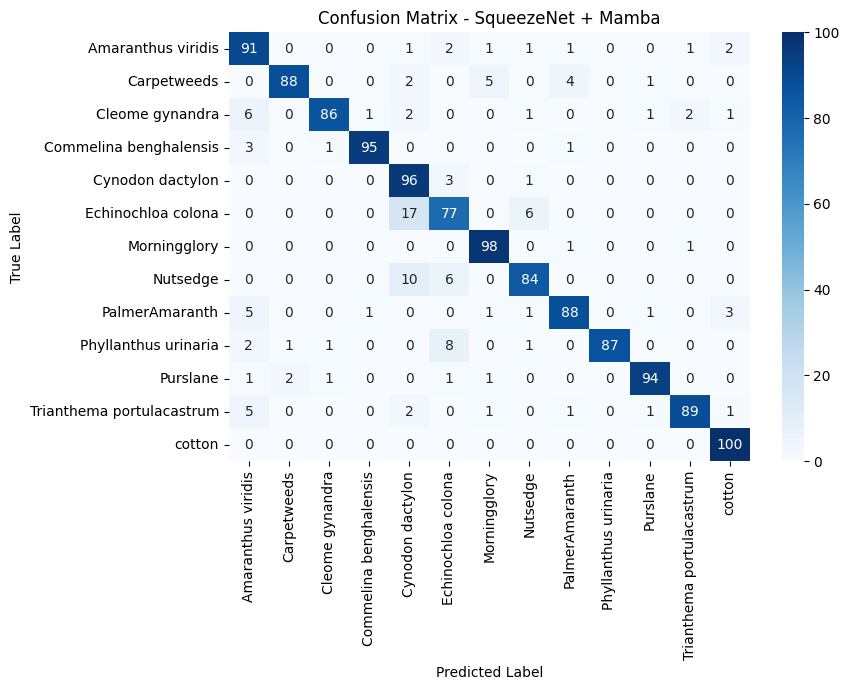

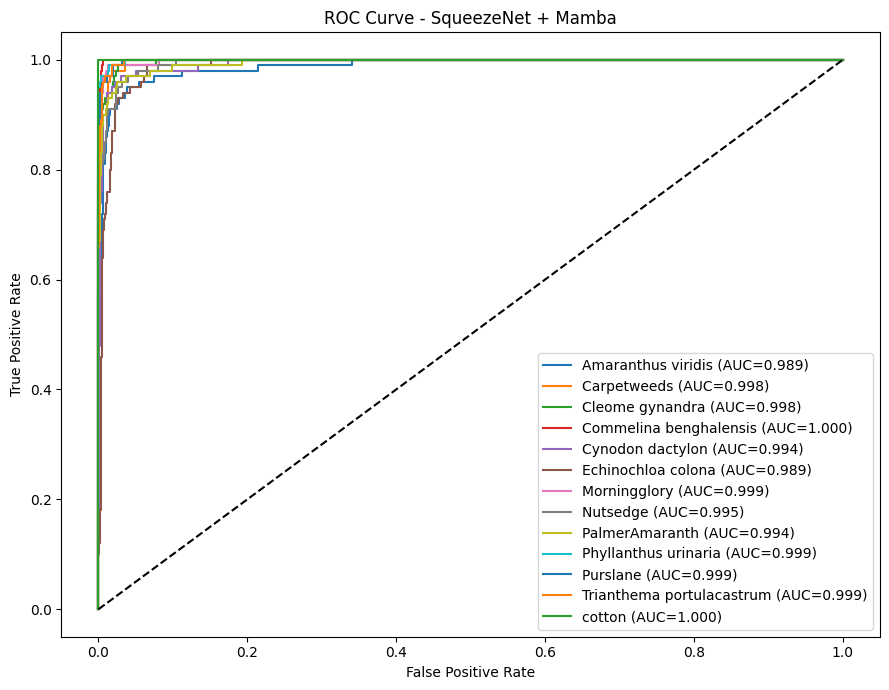


Running Grad-CAM Gallery...


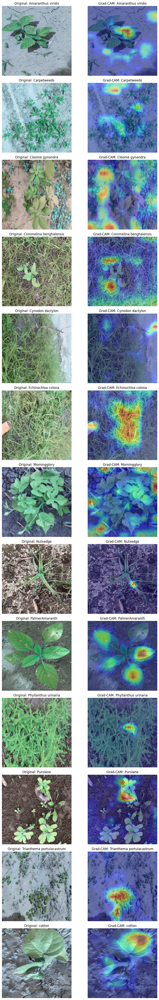

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 21.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done

Running LIME Gallery...


  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

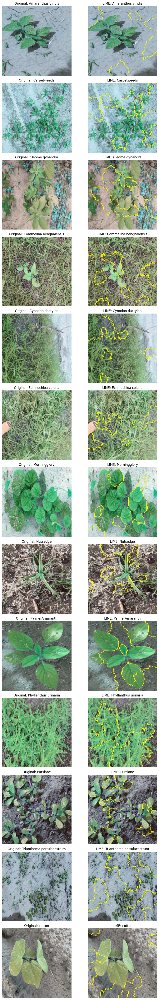

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report, precision_recall_fscore_support,
    accuracy_score, confusion_matrix, roc_curve, auc
)
from sklearn.preprocessing import label_binarize

# ============================================================
# 1. FLOAT32 & CUSTOM LAYER REGISTRATION
# ============================================================
# This cell is self-contained: it reloads the best saved models from
# Drive so you can run evaluation on its own (e.g. after a restart)
# without retraining.

tf.keras.mixed_precision.set_global_policy('float32')

@tf.keras.utils.register_keras_serializable(package="custom")
class LayerScale(tf.keras.layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            name="gamma",
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
        )
        super().build(input_shape)

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value,
        })
        return config


# ============================================================
# 2. DRIVE MOUNT & MODEL LOADING (NO RETRAINING)
# ============================================================

if not os.path.exists('/content/drive'):
    from google.colab import drive
    drive.mount('/content/drive')

BASE_SAVE_PATH = '/content/drive/MyDrive/SqueezeNet_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba.keras'

print("Drive se trained models load ho rahe hain...")
model_base = tf.keras.models.load_model(BASE_SAVE_PATH)
model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale},
    safe_mode=False
)
print("Models Memory mein load ho gaye!")

IMG_SIZE = 224

_SQUEEZENET_MEAN = tf.constant([103.939, 116.779, 123.68])  # BGR means

def squeezenet_preprocess_input(x):
    x = tf.cast(x, tf.float32)
    x = x[..., ::-1]  # RGB -> BGR
    x = x - _SQUEEZENET_MEAN
    return x


# ============================================================
# 3. GET TEST PREDICTIONS
# ============================================================

test_ds_eval = make_dataset(test_files, test_labels)
test_ds_eval = test_ds_eval.map(
    lambda x, y: (squeezenet_preprocess_input(tf.image.resize(x, (IMG_SIZE, IMG_SIZE))), y),
    num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE)

def get_all_predictions(models_dict, dataset):
    y_true = []
    y_prob = {name: [] for name in models_dict}

    for images, labels in dataset:
        y_true.extend(labels.numpy())
        for name, mdl in models_dict.items():
            probs = mdl(images, training=False).numpy()
            y_prob[name].extend(probs)

    y_true = np.array(y_true)

    results = {}
    for name in models_dict:
        probs_arr = np.array(y_prob[name])
        preds_arr = np.argmax(probs_arr, axis=1)
        results[name] = {"y_pred": preds_arr, "y_prob": probs_arr}

    return y_true, results

y_true, preds = get_all_predictions(
    {"base": model_base, "mamba": model_mamba}, test_ds_eval
)

y_pred_base, y_prob_base = preds["base"]["y_pred"], preds["base"]["y_prob"]
y_pred_mamba, y_prob_mamba = preds["mamba"]["y_pred"], preds["mamba"]["y_prob"]


# ============================================================
# 4. METRICS & REPORTS
# ============================================================

print("\n" + "=" * 60)
print("SqueezeNet + MAMBA CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(y_true, y_pred_mamba, target_names=class_names, digits=4))

print("\n" + "=" * 60)
print("SqueezeNet BASELINE CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(y_true, y_pred_base, target_names=class_names, digits=4))

metrics_base = precision_recall_fscore_support(
    y_true, y_pred_base, average='weighted', zero_division=0
)
metrics_mamba = precision_recall_fscore_support(
    y_true, y_pred_mamba, average='weighted', zero_division=0
)

print("\n" + "=" * 60)
print("OVERALL PERFORMANCE")
print("=" * 60)
print("Model                 Accuracy   Precision   Recall   F1")
print(f"SqueezeNet        {accuracy_score(y_true, y_pred_base):.4f}     "
      f"{metrics_base[0]:.4f}      {metrics_base[1]:.4f}    {metrics_base[2]:.4f}")
print(f"SqueezeNet+Mamba  {accuracy_score(y_true, y_pred_mamba):.4f}     "
      f"{metrics_mamba[0]:.4f}      {metrics_mamba[1]:.4f}    {metrics_mamba[2]:.4f}")


# ============================================================
# 5. CONFUSION MATRIX & ROC-AUC PLOTS
# ============================================================

cm = confusion_matrix(y_true, y_pred_mamba)
fig = plt.figure(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - SqueezeNet + Mamba')
plt.tight_layout()
plt.show()
plt.close(fig)

fig = plt.figure(figsize=(9, 7))
if num_classes == 2:
    fpr, tpr, _ = roc_curve(y_true, y_prob_mamba[:, 1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_names[1]} (AUC={roc_auc:.3f})')
else:
    y_true_bin = label_binarize(y_true, classes=range(num_classes))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob_mamba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC={roc_auc:.3f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SqueezeNet + Mamba')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()
plt.close(fig)


# ============================================================
# 6. KERAS 3 BULLETPROOF GRAD-CAM (LAYER HOOKING METHOD)
# ============================================================

def make_gradcam_heatmap_hook(img_array, model):
    target_layer = None
    for layer in reversed(model.layers):
        try:
            shape = layer.output_shape
            if isinstance(shape, list): shape = shape[0]
            if len(shape) == 4 and 'input' not in layer.name:
                target_layer = layer
                break
        except Exception:
            continue

    if target_layer is None:
        return None, False

    captured_output = []
    original_call = target_layer.call

    def hook_call(*args, **kwargs):
        out = original_call(*args, **kwargs)
        captured_output.append(out)
        return out

    target_layer.call = hook_call

    try:
        img_cast = tf.cast(img_array, tf.float32)
        with tf.GradientTape() as tape:
            preds = model(img_cast, training=False)
            if isinstance(preds, list): preds = preds[0]
            pred_index = tf.argmax(preds[0])
            class_score = preds[:, pred_index]

        if not captured_output:
            target_layer.call = original_call
            return None, False

        conv_output = captured_output[0]
        grads = tape.gradient(class_score, conv_output)

        target_layer.call = original_call

        if grads is None:
            return None, False

        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_out_0 = conv_output[0]

        heatmap = conv_out_0 @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0)

        max_val = tf.reduce_max(heatmap)
        if max_val > 0:
            heatmap = heatmap / (max_val + 1e-10)
            return heatmap.numpy(), True
        return None, False

    except Exception as e:
        target_layer.call = original_call
        return None, False


def run_gradcam_gallery(model, dataset, class_names, num_classes, title):
    found_classes = set()
    fig = plt.figure(figsize=(10, 4 * num_classes))
    plot_index = 1

    for images, labels in dataset:
        for i in range(len(labels)):
            class_id = int(labels[i].numpy())
            if class_id in found_classes:
                continue

            img = images[i]
            heatmap, ok = make_gradcam_heatmap_hook(
                tf.expand_dims(img, axis=0), model
            )

            if not ok:
                continue

            found_classes.add(class_id)

            heatmap_resized = tf.image.resize(
                heatmap[..., np.newaxis], (IMG_SIZE, IMG_SIZE)
            ).numpy().squeeze()

            img_display = img.numpy()
            img_display = (img_display - img_display.min()) / (
                img_display.max() - img_display.min() + 1e-7
            )

            plt.subplot(num_classes, 2, plot_index)
            plt.imshow(img_display)
            plt.title(f'Original: {class_names[class_id]}')
            plt.axis('off')

            plt.subplot(num_classes, 2, plot_index + 1)
            plt.imshow(img_display)
            plt.imshow(heatmap_resized, cmap='jet', alpha=0.4)
            plt.title(f'Grad-CAM: {class_names[class_id]}')
            plt.axis('off')

            plot_index += 2

            if len(found_classes) == num_classes:
                break
        if len(found_classes) == num_classes:
            break

    plt.tight_layout()
    plt.show()
    plt.close(fig)

print("\nRunning Grad-CAM Gallery...")
run_gradcam_gallery(model_mamba, test_ds_eval, class_names, num_classes, title="SqueezeNet+Mamba")


# ============================================================
# 7. LIME EXPLAINABILITY
# ============================================================

get_ipython().system('pip install lime -q')

from lime import lime_image
from skimage.segmentation import mark_boundaries

explainer = lime_image.LimeImageExplainer(random_state=SEED if 'SEED' in globals() else 42)

def predict_fn(raw_images):
    raw_images = raw_images.copy()
    if raw_images.max() <= 1.0:
        raw_images = raw_images * 255.0
    preprocessed = squeezenet_preprocess_input(raw_images)
    return model_mamba(preprocessed, training=False).numpy()

def run_lime_gallery(dataset, class_names, num_classes):
    found_classes = set()
    fig = plt.figure(figsize=(10, 4 * num_classes))
    plot_index = 1

    for images, labels in dataset:
        for i in range(len(labels)):
            class_id = int(labels[i].numpy())
            if class_id in found_classes:
                continue

            img_norm = images[i].numpy()
            img_min, img_max = img_norm.min(), img_norm.max()
            if img_max > img_min:
                img_rgb = ((img_norm - img_min) / (img_max - img_min) * 255.0).astype(np.uint8)
            else:
                img_rgb = np.zeros_like(img_norm, dtype=np.uint8)

            found_classes.add(class_id)

            try:
                explanation = explainer.explain_instance(
                    img_rgb,
                    predict_fn,
                    top_labels=1,
                    hide_color=0,
                    num_samples=300
                )
                temp, mask = explanation.get_image_and_mask(
                    explanation.top_labels[0],
                    positive_only=True,
                    num_features=8,
                    hide_rest=False
                )
                lime_img = mark_boundaries(temp / 255.0, mask)
            except Exception as e:
                print(f"[LIME] Warning for class {class_names[class_id]}: {e}")
                lime_img = img_rgb / 255.0

            plt.subplot(num_classes, 2, plot_index)
            plt.imshow(img_rgb)
            plt.title(f'Original: {class_names[class_id]}')
            plt.axis('off')

            plt.subplot(num_classes, 2, plot_index + 1)
            plt.imshow(lime_img)
            plt.title(f'LIME: {class_names[class_id]}')
            plt.axis('off')

            plot_index += 2

            if len(found_classes) == num_classes:
                break
        if len(found_classes) == num_classes:
            break

    plt.tight_layout()
    plt.show()
    plt.close(fig)

print("\nRunning LIME Gallery...")
run_lime_gallery(test_ds_eval, class_names, num_classes)


## SHAP Explainability + Statistical Tests (McNemar, Wilcoxon)

Loading SqueezeNet saved models...
Local cotton dataset already exists.

MODEL INPUT & OUTPUT SHAPES
Base Model Input Shape  : (None, 224, 224, 3)
Base Model Output Shape : (None, 13)
Mamba Model Input Shape  : (None, 224, 224, 3)
Mamba Model Output Shape : (None, 13)

PARAMETER COUNTS
SqueezeNet Base Parameters       : 858,189
SqueezeNet+Mamba Parameters : 1,191,885

Calculating SHAP values...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_4
Received: inputs=['Tensor(shape=(13, 224, 224, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_4
Received: inputs=['Tensor(shape=(50, 224, 224, 3))']
  warnings.warn(msg)


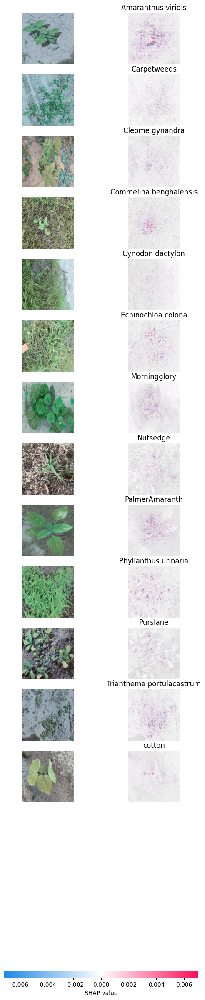


Generating test predictions for statistical tests...

McNemar's Test (SqueezeNet Base vs SqueezeNet+Mamba)
Contingency table [[both_correct, base_only], [mamba_only, both_wrong]]:
    Both correct     : 1073
    Base only correct: 42
    Mamba only correct: 100
    Both wrong       : 85
Statistic : 22.8803
p-value   : 0.000002
=> Significant difference between models (p < 0.05)

Wilcoxon Signed-Rank Test (per-class F1: SqueezeNet Base vs Mamba)
Per-class F1 (Base) : [0.7834 0.9206 0.8657 0.8865 0.8    0.7213 0.9072 0.8571 0.8416 0.8506
 0.901  0.911  0.9091]
Per-class F1 (Mamba): [0.8545 0.9215 0.9101 0.9645 0.8348 0.7817 0.9469 0.8615 0.898  0.9305
 0.9495 0.9223 0.9662]
Statistic : 0.0000
p-value   : 0.000244
=> Significant difference in per-class F1 scores.

FINAL RESULTS - SQUEEZENET COTTON DATASET
SqueezeNet Base Accuracy    : 85.77%
SqueezeNet + Mamba Accuracy : 90.23%

Base Model saved at:
/content/drive/MyDrive/SqueezeNet_Cotton.keras

Mamba Model saved at:
/content/drive/MyDr

In [6]:
import os
import zipfile
import pathlib
import numpy as np
import tensorflow as tf
import keras
from tensorflow.keras import layers
from sklearn.metrics import (
    classification_report,
    precision_recall_fscore_support,
    accuracy_score
)
from statsmodels.stats.contingency_tables import mcnemar
from scipy.stats import wilcoxon

# ============================================================
# 1. CONFIGURATION & SQUEEZENET PATHS
# ============================================================
# Self-contained cell: rebuilds the dataset (auto-unzipping from Drive
# if needed) and reloads the saved models, so it can run standalone.

IMG_SIZE = 224  # SqueezeNet standard input size
BATCH_SIZE = 32
SEED = 42

DRIVE_ZIP_PATH = '/content/drive/MyDrive/cotton_weed_merged.zip'
LOCAL_DATA_PATH = '/content/cotton_weed_local'

BASE_SAVE_PATH = '/content/drive/MyDrive/SqueezeNet_Cotton.keras'
MAMBA_SAVE_PATH = '/content/drive/MyDrive/Model/SqueezeNet_Cotton_Mamba.keras'

_SQUEEZENET_MEAN = tf.constant([103.939, 116.779, 123.68])  # BGR means

def squeezenet_preprocess_input(x):
    x = tf.cast(x, tf.float32)
    x = x[..., ::-1]  # RGB -> BGR
    x = x - _SQUEEZENET_MEAN
    return x


# ============================================================
# 2. CUSTOM LAYER REGISTRATION
# ============================================================

@keras.saving.register_keras_serializable(package="custom", name="LayerScale")
class LayerScale(layers.Layer):
    def __init__(self, channels, init_value=1e-2, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.init_value = init_value

    def build(self, input_shape):
        self.gamma = self.add_weight(
            shape=(self.channels,),
            initializer=tf.keras.initializers.Constant(self.init_value),
            trainable=True,
            name="gamma"
        )

    def call(self, inputs):
        return inputs * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update({
            "channels": self.channels,
            "init_value": self.init_value
        })
        return config


# ============================================================
# 3. MODEL LOADING (SQUEEZENET BASE & MAMBA)
# ============================================================

print("Loading SqueezeNet saved models...")

def load_keras_model(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Model file not found at: {path}")
    return tf.keras.models.load_model(path, compile=False)

model_base = load_keras_model(BASE_SAVE_PATH)
model_mamba = tf.keras.models.load_model(
    MAMBA_SAVE_PATH,
    custom_objects={'LayerScale': LayerScale},
    compile=False,
    safe_mode=False
)

model_base_fp32 = model_base
model_mamba_fp32 = model_mamba


# ============================================================
# 4. RESTORE DATASET (AUTO-UNZIP) & DATASET PIPELINE
# ============================================================

def find_class_root(extracted_path):
    extracted_path = pathlib.Path(extracted_path)

    def has_class_subdirs(p):
        subdirs = [d for d in p.iterdir() if d.is_dir()]
        if not subdirs:
            return False
        for d in subdirs:
            for f in d.iterdir():
                if f.suffix.lower() in {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}:
                    return True
        return False

    if has_class_subdirs(extracted_path):
        return extracted_path

    children = [d for d in extracted_path.iterdir() if d.is_dir()]
    if len(children) == 1 and has_class_subdirs(children[0]):
        return children[0]

    for d in extracted_path.rglob('*'):
        if d.is_dir() and has_class_subdirs(d):
            return d

    return extracted_path


if not os.path.exists(LOCAL_DATA_PATH):
    if not os.path.exists(DRIVE_ZIP_PATH):
        raise FileNotFoundError(f"Zip dataset not found at: {DRIVE_ZIP_PATH}")
    print("Extracting cotton dataset zip to local Colab storage...")
    os.makedirs(LOCAL_DATA_PATH, exist_ok=True)
    with zipfile.ZipFile(DRIVE_ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(LOCAL_DATA_PATH)
    print("Dataset extracted successfully.")
else:
    print("Local cotton dataset already exists.")

base_data_path = str(find_class_root(LOCAL_DATA_PATH))

IMG_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp', '.tmp'}
data_dir = pathlib.Path(base_data_path)
class_names = sorted([d.name for d in data_dir.iterdir() if d.is_dir()])
num_classes = len(class_names)

train_files, val_files, test_files = [], [], []
train_labels, val_labels, test_labels = [], [], []
rng = np.random.default_rng(SEED)

for idx, cls in enumerate(class_names):
    cls_dir = data_dir / cls
    files = sorted([str(p) for p in cls_dir.iterdir() if p.suffix.lower() in IMG_EXTENSIONS])
    files = np.array(files)
    rng.shuffle(files)

    n = len(files)
    n_train = int(n * 0.70)
    n_val = int(n * 0.10)

    train_files.extend(files[:n_train]);                train_labels.extend([idx] * n_train)
    val_files.extend(files[n_train:n_train + n_val]);     val_labels.extend([idx] * n_val)
    test_files.extend(files[n_train + n_val:]);           test_labels.extend([idx] * (n - n_train - n_val))

def load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = squeezenet_preprocess_input(img)
    img.set_shape((IMG_SIZE, IMG_SIZE, 3))
    return img, label

def make_dataset(files, labels, training=False):
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(files), seed=SEED)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_dataset(train_files, train_labels, training=True)
test_ds = make_dataset(test_files, test_labels)


# ============================================================
# 5. MODEL INPUT / OUTPUT SHAPES & PARAMETER COUNTS
# ============================================================

print("\n" + "=" * 50)
print("MODEL INPUT & OUTPUT SHAPES")
print("=" * 50)
print(f"Base Model Input Shape  : {model_base.input_shape}")
print(f"Base Model Output Shape : {model_base.output_shape}")
print(f"Mamba Model Input Shape  : {model_mamba.input_shape}")
print(f"Mamba Model Output Shape : {model_mamba.output_shape}")

print("\n" + "=" * 50)
print("PARAMETER COUNTS")
print("=" * 50)
print(f"SqueezeNet Base Parameters       : {model_base.count_params():,}")
print(f"SqueezeNet+Mamba Parameters : {model_mamba.count_params():,}")


# ============================================================
# 6. SHAP EXPLAINABILITY
# ============================================================

get_ipython().system('pip install shap -q')
import shap

background = []
for images, _ in train_ds.take(2):
    background.append(images.numpy())
background = np.vstack(background)[:20].astype(np.float32)

class_samples = {}
for images, labels in test_ds:
    for i in range(len(labels)):
        class_id = int(labels[i].numpy())
        if class_id not in class_samples:
            class_samples[class_id] = images[i].numpy()
    if len(class_samples) == num_classes:
        break

test_images_shap = np.stack(
    [class_samples[i] for i in sorted(class_samples)]
).astype(np.float32)

print("\nCalculating SHAP values...")

shap_values = None
try:
    explainer_shap = shap.GradientExplainer(model_mamba_fp32, background)
    shap_values = explainer_shap.shap_values(test_images_shap)
except Exception as e:
    print(f"[SHAP] GradientExplainer failed ({e}); trying generic Explainer fallback...")
    try:
        explainer_shap = shap.Explainer(model_mamba_fp32, background)
        shap_values = explainer_shap(test_images_shap).values
    except Exception as e2:
        print(f"[SHAP] Fallback also failed: {e2}")
        shap_values = None

if shap_values is not None:
    if isinstance(shap_values, list):
        shap_values = [np.array(x) for x in shap_values]
    else:
        shap_values = np.array(shap_values)
        if shap_values.ndim == 5:
            shap_values = [shap_values[..., i] for i in range(shap_values.shape[-1])]
        else:
            shap_values = [shap_values]

    try:
        ordered_class_ids = sorted(class_samples)
        pred_labels = [class_names[c] for c in ordered_class_ids]

        single_class_shap = np.stack([
            shap_values[class_id][idx]
            for idx, class_id in enumerate(ordered_class_ids)
        ])

        # Rescale normalized images back for display
        display_imgs = (test_images_shap - test_images_shap.min()) / (test_images_shap.max() - test_images_shap.min() + 1e-7)

        shap.image_plot(
            [single_class_shap],
            display_imgs,
            labels=np.array([pred_labels]),
            show=True
        )
    except Exception as e:
        print(f"[SHAP] Plotting failed: {e}.")
else:
    print("[SHAP] No SHAP values could be computed — skipping visualization.")


# ============================================================
# 7. GENERATE PREDICTIONS FOR STATISTICAL TESTS
# ============================================================

print("\nGenerating test predictions for statistical tests...")
y_true = []
y_pred_base_list = []
y_pred_mamba_list = []

for images, labels in test_ds:
    y_true.extend(labels.numpy())
    preds_b = model_base(images, training=False).numpy()
    preds_m = model_mamba(images, training=False).numpy()
    y_pred_base_list.extend(np.argmax(preds_b, axis=1))
    y_pred_mamba_list.extend(np.argmax(preds_m, axis=1))

y_true = np.array(y_true)
y_pred_base = np.array(y_pred_base_list)
y_pred_mamba = np.array(y_pred_mamba_list)


# ============================================================
# 8. McNEMAR'S TEST
# ============================================================

correct_base = (y_pred_base == y_true)
correct_mamba = (y_pred_mamba == y_true)

a = np.sum(correct_base & correct_mamba)
b = np.sum(correct_base & ~correct_mamba)
c = np.sum(~correct_base & correct_mamba)
d = np.sum(~correct_base & ~correct_mamba)

table = [[a, b], [c, d]]

result = mcnemar(table, exact=(b + c < 25), correction=True)

print("\n" + "=" * 60)
print("McNemar's Test (SqueezeNet Base vs SqueezeNet+Mamba)")
print("=" * 60)
print("Contingency table [[both_correct, base_only], [mamba_only, both_wrong]]:")
print(f"    Both correct     : {a}")
print(f"    Base only correct: {b}")
print(f"    Mamba only correct: {c}")
print(f"    Both wrong       : {d}")
print(f"Statistic : {result.statistic:.4f}")
print(f"p-value   : {result.pvalue:.6f}")

if result.pvalue < 0.05:
    print("=> Significant difference between models (p < 0.05)")
else:
    print("=> No significant difference between models (p >= 0.05)")


# ============================================================
# 9. WILCOXON TEST ON PER-CLASS F1 SCORES
# ============================================================

_, _, f1_base, _ = precision_recall_fscore_support(
    y_true, y_pred_base, labels=range(num_classes), zero_division=0
)
_, _, f1_mamba, _ = precision_recall_fscore_support(
    y_true, y_pred_mamba, labels=range(num_classes), zero_division=0
)

print("\n" + "=" * 60)
print("Wilcoxon Signed-Rank Test (per-class F1: SqueezeNet Base vs Mamba)")
print("=" * 60)
print("Per-class F1 (Base) :", np.round(f1_base, 4))
print("Per-class F1 (Mamba):", np.round(f1_mamba, 4))

try:
    statistic, p_value = wilcoxon(f1_base, f1_mamba)
    print(f"Statistic : {statistic:.4f}")
    print(f"p-value   : {p_value:.6f}")
    if p_value < 0.05:
        print("=> Significant difference in per-class F1 scores.")
    else:
        print("=> No significant difference in per-class F1 scores.")
except Exception as e:
    print(f"Wilcoxon test could not be calculated: {e}")


# ============================================================
# 10. FINAL RESULTS
# ============================================================

print("\n" + "=" * 70)
print("FINAL RESULTS - SQUEEZENET COTTON DATASET")
print("=" * 70)
print(f"SqueezeNet Base Accuracy    : {accuracy_score(y_true, y_pred_base) * 100:.2f}%")
print(f"SqueezeNet + Mamba Accuracy : {accuracy_score(y_true, y_pred_mamba) * 100:.2f}%")
print(f"\nBase Model saved at:\n{BASE_SAVE_PATH}")
print(f"\nMamba Model saved at:\n{MAMBA_SAVE_PATH}")


In [7]:
# ============================================================
# GFLOPs — SqueezeNet & SqueezeNet + Vision Mamba
# ============================================================

import tensorflow as tf
import numpy as np

def get_gflops(model, img_size=224):
    try:
        # Freeze model graph
        inputs = tf.TensorSpec(
            [1, img_size, img_size, 3],
            tf.float32
        )

        @tf.function
        def forward(x):
            return model(x, training=False)

        concrete = forward.get_concrete_function(inputs)

        from tensorflow.python.profiler.model_analyzer import profile
        from tensorflow.python.profiler.option_builder import ProfileOptionBuilder

        opts = ProfileOptionBuilder.float_operation()
        opts['output'] = 'none'

        prof = profile(
            concrete.graph,
            options=opts
        )

        return prof.total_float_ops / 1e9

    except Exception as e:
        print("GFLOPs calculation failed:", str(e))
        return None


print("=" * 60)
print("GFLOPs ANALYSIS")
print("=" * 60)

for name, model in [
    ("SqueezeNet", model_base),
    ("SqueezeNet + Vision Mamba", model_mamba)
]:
    gflops = get_gflops(model, IMG_SIZE)

    print(f"\n{name}")
    print(f"Parameters : {model.count_params():,}")

    if gflops is not None:
        print(f"GFLOPs     : {gflops:.4f}")
    else:
        print("GFLOPs     : Could not calculate")

print("\n" + "=" * 60)
print("GFLOPs calculation completed.")
print("=" * 60)

GFLOPs ANALYSIS


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.



SqueezeNet
Parameters : 858,189
GFLOPs     : 0.5310

SqueezeNet + Vision Mamba
Parameters : 1,191,885
GFLOPs     : 0.6663

GFLOPs calculation completed.
